<a href="https://colab.research.google.com/github/amir-asari/SEBB4083-Assignment2024/blob/main/Group_4_SEBB4083_Mini_Project_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mini Project 2024 (Groceries Detection)
### Total marks: 30

### Group No.: 3

###Group Members:
1) TAN WEI XUAN A20EB0080

2) WANG JIAYI A20EB4012

3) SITI NUR BALQIS BINTI AMRAN A20EB0075

4) MUHAMMAD IKMAL DANISH BIN AZEMI A20EB0040

5) MUHAMMAD ADI LUQMAN BIN ROHAIDZAT A20EB0036


## Chapter 1: Introduction


###1.1 Background of study and related works

Visually impaired individuals frequently struggle to recognise and differentiate between various supermarket items. Their independence and quality of life can be greatly enhanced by an automated system that can precisely classify food. The provision of a dependable and effective means of identifying groceries enables visually impaired people to do daily duties, such as meal preparation and grocery shopping, more effectively. The project aims to develop an automated algorithm using Convolutional Neural Network (CNN) transfer learning to classify two classes of groceries. The algorithm will be designed to assist visually impaired individuals in identifying grocery items. To achieve this, a local groceries dataset containing two classes of groceries such as cereal and flours will be created.

Convolutional Neural Networks (CNNs) have proven to be highly effective in image classification tasks. According to Siddiqui et al. (2017), they are capable of learning hierarchical features from raw image data, making them suitable for complex classification problems as in Figure 1.1 below. Transfer learning, on the other hand, involves using pre-trained models as a starting point for a new task, which can significantly reduce training time and improve performance, especially when the target dataset is small (Khanam, 2023). There are existing datasets available for groceries classification, such as the Freiburg Groceries Dataset. However, they may not always be suitable for specific applications or local contexts. Creating a local dataset can help address this issue by capturing the unique characteristics of the groceries available in the target region. However, collecting and annotating a large dataset can be time-consuming and resource-intensive.

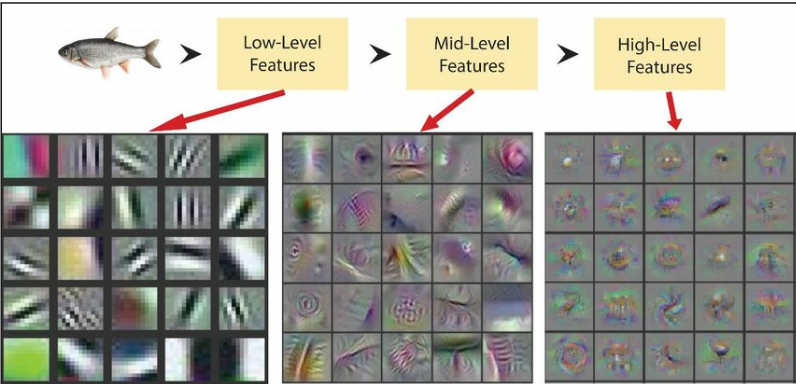

Figure 1.1	Hierarchical representation learning by a CNN where the initial layer detects simple patterns like edges and gradients while higher layers detect more abstract features (Yosinski et al., 2015).



By creating a local groceries dataset and following the outlined approach by utilizing CNN, we will be able to train a robust and reliable classifier that can accurately identify grocery items. This system has the potential to significantly improve the independence and quality of life for visually impaired individuals by providing them with a tool to identify and manage their groceries more effectively.




###1.2 Objectives

*   To develop an automated algorithm to classify between two classes of
groceries based on captured groceries images.

*   To develop the algorithm based on the Convolutional Neural Network transfer learning approach.




## Chapter 2: Methodology and Results

**a) No image augmentation, Only unfreeze the last layer**

### **Setup**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil

import tensorflow as tf
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

!pip install zipfile36
from zipfile36 import ZipFile

###Data preprocessing



####Download data from gdrive link

In [ ]:
! gdown 1KKnQxPKhpps01K5KM9s1h2pJKmMYIL-S

Downloading...
From: https://drive.google.com/uc?id=1KKnQxPKhpps01K5KM9s1h2pJKmMYIL-S
To: /content/G3 Dataset.zip
100% 14.3M/14.3M [00:00<00:00, 28.4MB/s]


####Unzip the download file

In [ ]:
with ZipFile('/content/G3 Dataset.zip','r') as zipObj:
  zipObj.extractall()

####Load data using Keras utility

Next, load these images off disk using the helpful tf.keras.utils.image_dataset_from_directory utility. This will take you from a directory of images on disk to a tf.data.Dataset in just a couple lines of code.

Create a dataset

Define some parameters for the ImageDataGenerator:

In [ ]:
batch_size = 50 # Of course here, we are using mini-batch gradient descent
img_height = 224
img_width = 224


Data splitting, into 70% training data and 30% testing data. Once splitted, all data will saved in folder called training_data and testing_data

In [ ]:
# Define the path to your dataset directory
dataset_dir = '/content/G3'

# Define the path to the directory where you want to create the train and test folders
output_dir = '/content/output'

# Define the percentage of data to be used for testing
test_split = 0.3

# Get the list of subfolders in the dataset directory
subfolders = [subfolder for subfolder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, subfolder))]

print(subfolders)

# Define the train and test folder paths
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')

# Delete train and test folders if they already exist
if os.path.exists(train_dir):
    shutil.rmtree(train_dir)
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)

# Create the train and test folders in the output directory
os.makedirs(train_dir)
os.makedirs(test_dir)

# Iterate over each subfolder and split the images into train and test sets
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_dir, subfolder)
    images = os.listdir(subfolder_path)
    train_images, test_images = train_test_split(images, test_size=test_split, random_state=42)

    # Create the subfolders inside train and test directories
    train_subfolder_dir = os.path.join(train_dir, subfolder)
    test_subfolder_dir = os.path.join(test_dir, subfolder)
    os.makedirs(train_subfolder_dir)
    os.makedirs(test_subfolder_dir)

    # Move the train images to the train folder
    for image in train_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(train_dir, subfolder, image)
        print(src)
        print(dst)
        shutil.copyfile(src, dst)

    # Move the test images to the test folder
    for image in test_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(test_dir, subfolder, image)
        shutil.copyfile(src, dst)

['Cereal', 'Flour']
/content/G3/Cereal/IMG_2956.jpg
/content/output/train/Cereal/IMG_2956.jpg
/content/G3/Cereal/1717913419186.jpg
/content/output/train/Cereal/1717913419186.jpg
/content/G3/Cereal/IMG_1730.jpg
/content/output/train/Cereal/IMG_1730.jpg
/content/G3/Cereal/IMG_1636.jpg
/content/output/train/Cereal/IMG_1636.jpg
/content/G3/Cereal/IMG_2994.jpg
/content/output/train/Cereal/IMG_2994.jpg
/content/G3/Cereal/1717838328775.jpg
/content/output/train/Cereal/1717838328775.jpg
/content/G3/Cereal/1717838328123.jpg
/content/output/train/Cereal/1717838328123.jpg
/content/G3/Cereal/Copy of Copy of IMG_20240527_104142.jpg
/content/output/train/Cereal/Copy of Copy of IMG_20240527_104142.jpg
/content/G3/Cereal/Copy of Copy of IMG_20240527_103858.jpg
/content/output/train/Cereal/Copy of Copy of IMG_20240527_103858.jpg
/content/G3/Cereal/Copy of Copy of IMG_20240527_103720.jpg
/content/output/train/Cereal/Copy of Copy of IMG_20240527_103720.jpg
/content/G3/Cereal/1717343588174.jpg
/content/ou

In [ ]:
# Define the path to the subfolder containing the images
test_Cereal_path = '/content/output/test/Cereal'
test_Flour_path = '/content/output/test/Flour'
train_Cereal_path = '/content/output/train/Cereal'
train_Flour_path = '/content/output/train/Flour'

# Count the number of images in the subfolder
num_images1 = len([name for name in os.listdir(test_Cereal_path) if os.path.isfile(os.path.join(test_Cereal_path, name))])
num_images2 = len([name for name in os.listdir(test_Flour_path) if os.path.isfile(os.path.join(test_Flour_path, name))])
num_images3 = len([name for name in os.listdir(train_Cereal_path) if os.path.isfile(os.path.join(train_Cereal_path, name))])
num_images4 = len([name for name in os.listdir(train_Flour_path) if os.path.isfile(os.path.join(train_Flour_path, name))])

# Print the number of images in the subfolder
print(f"Number of images in the test/Cereal: {num_images1}")
print(f"Number of images in the test/Flour: {num_images2}")
print(f"Number of images in the train/Cereal: {num_images3}")
print(f"Number of images in the train/Flour: {num_images4}")

Number of images in the test/Cereal: 150
Number of images in the test/Flour: 150
Number of images in the train/Cereal: 350
Number of images in the train/Flour: 350


After that, create a `tf.keras.preprocessing.image.ImageDataGenerator` object which will handle the image dataset for training and testing.

Then the object function called `flow_from_directory` is used provide batch of image dataset according to specification based on function input argument.

20% from the training data will be taken out and used as validation data

In [ ]:
# data_dir = '/content/G3'
# train_dataset = tf.keras.utils.image_dataset_from_directory(
#   data_dir,
#   validation_split=0.2,
#   subset="training",
#   seed=123,
#   shuffle=True,
#   image_size=(img_height, img_width),
#   batch_size=batch_size)


# validation_dataset = tf.keras.utils.image_dataset_from_directory(
#   data_dir,
#   validation_split=0.2,
#   subset="validation",
#   seed=123,
#   shuffle=True,
#   image_size=(img_height, img_width),
#   batch_size=batch_size)


# Create an instance of the ImageDataGenerator with for training and testing
train_data_generator = ImageDataGenerator( validation_split=0.2) # 20% from training will be leaved out for validation
test_data_generator = ImageDataGenerator()

names = ["Cereal" , "Flour"] #make sure the spelling is similar to the folder name

# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = 50,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

# Create the validation batch generator
validation_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (224, 224),
    class_mode = 'sparse', #make label as integer value
    subset='validation',
    batch_size = 50,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)


# Create the test generator
test_batches = test_data_generator.flow_from_directory(
    '/content/output/test',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    batch_size = 50,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 560 images belonging to 2 classes.
Found 140 images belonging to 2 classes.
Found 300 images belonging to 2 classes.


### Visualize the data

Here are the first nine images from the training dataset:

(50, 224, 224, 3)
(50,)


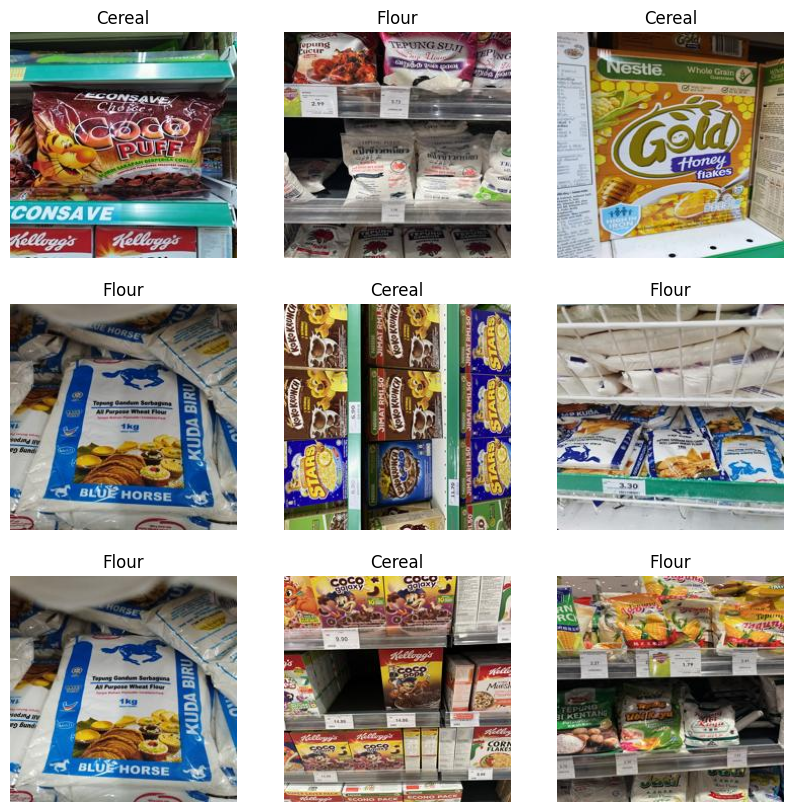

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

###Create the base model from the pre-trained VGG16

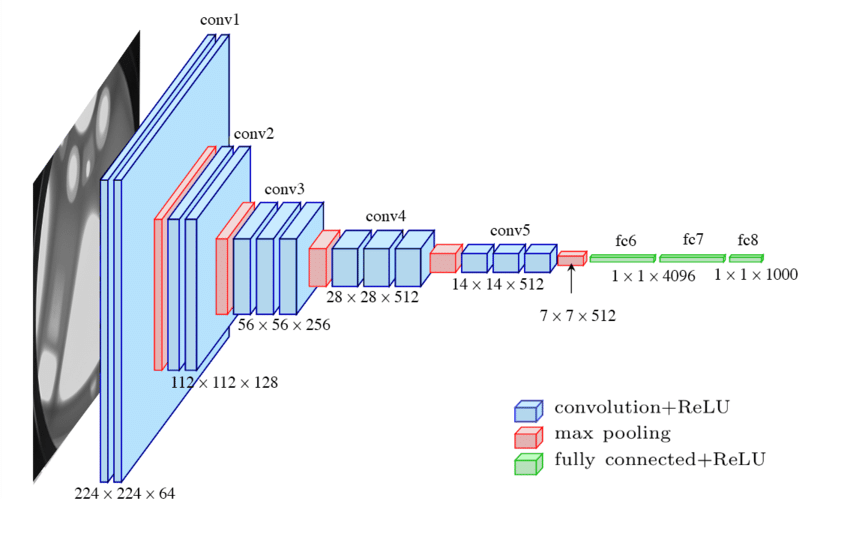

First, instantiate a VGG16 model pre-loaded with weights trained on ImageNet.

In [ ]:
# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

# print(type(base_model))
print("****VGG16 original network arhitecture****")
base_model.summary()

553467096/553467096 [==============================] - 9s 0us/step
****VGG16 original network arhitecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                 

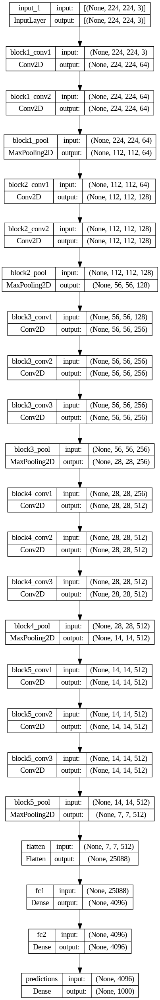

In [ ]:
tf.keras.utils.plot_model(base_model, to_file = 'VGG16_basemodel.png', show_shapes = True)

Create new model, copy all layers in VGG16 from the 1st until 2nd last layer

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                             

In [ ]:
#Freezing the existing weights
for layer in model.layers[-1:]:#unfreeze last layer only
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

# #example if your want to unfreeze 2 last layers
# for layer in model.layers[-2:]:
#     layer.trainable = True

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

###Compile the model

Compile the model before training it. Since there are two classes, use the tf.keras.losses.BinaryCrossentropy loss with from_logits=True since the model provides a linear output.

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


###Train the model



In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
12/12 [==============================] - 1165s 96s/step - loss: 227.3235 - accuracy: 0.5232 - val_loss: 0.7262 - val_accuracy: 0.5000
Epoch 2/3
12/12 [==============================] - 1152s 96s/step - loss: 0.7432 - accuracy: 0.4964 - val_loss: 0.7037 - val_accuracy: 0.5000
Epoch 3/3
12/12 [==============================] - 1140s 95s/step - loss: 0.6917 - accuracy: 0.4982 - val_loss: 0.6967 - val_accuracy: 0.5000


### Plot the learning curves

Let's take a look at the learning curves of the training and validation accuracy/loss when using the MobileNetV2 base model as a fixed feature extractor.

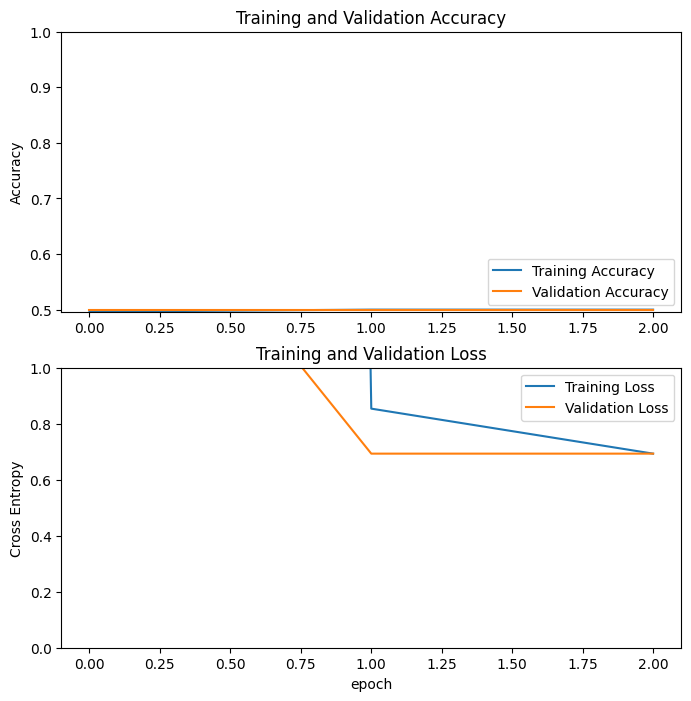

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()


### Test the model

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

6/6 [==============================] - 168s 28s/step - loss: 0.6931 - accuracy: 0.5000
Test accuracy: 0.5


Test the developed model in several test images and visual the image, the predicted label, actual label and the probability (in %)

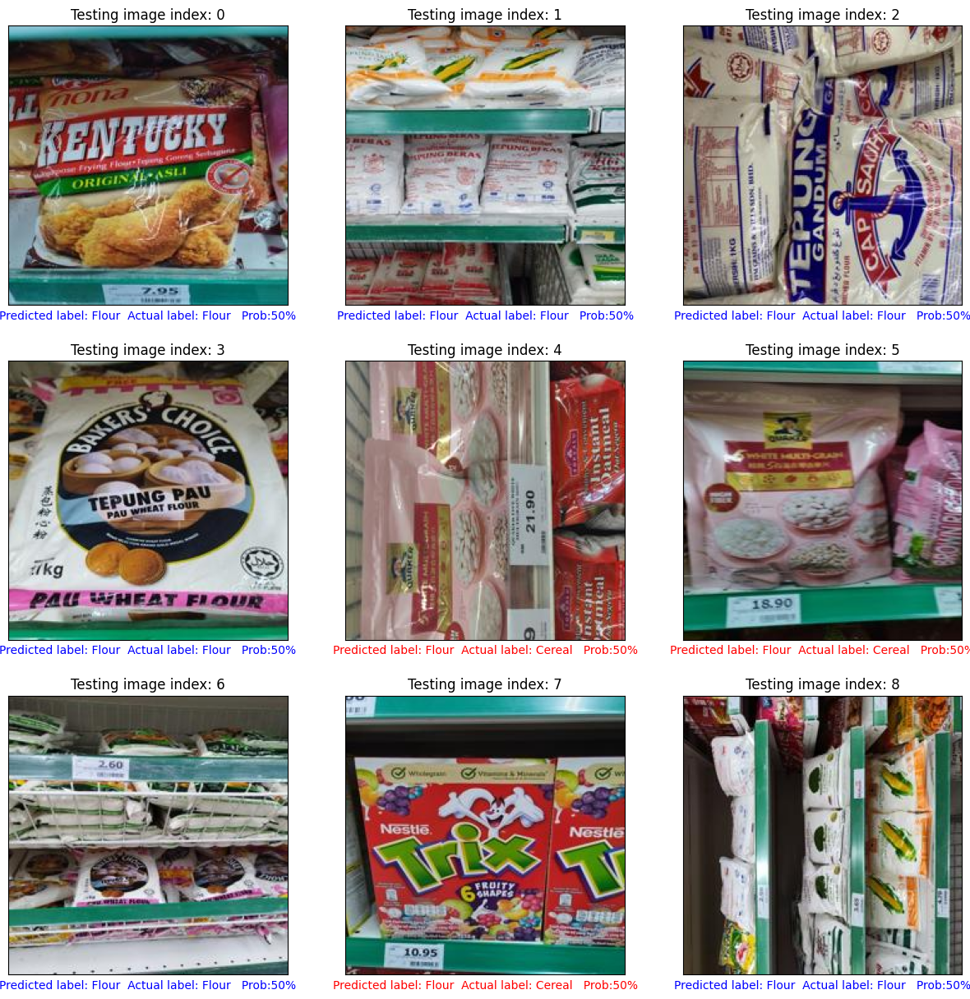

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

**b) With image augmentation, Only unfreeze the last layer**

In [ ]:
# Create an instance of the ImageDataGenerator with for training and testing
train_data_generator = ImageDataGenerator( validation_split=0.2,
                                          rotation_range = 20,
                                          width_shift_range=0.2,
                                          height_shift_range=0.2,
                                          ) # 20% from training will be leaved out for validation
test_data_generator = ImageDataGenerator()

names = ["Cereal" , "Flour"] #make sure the spelling is similar to the folder name

# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = 50,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

# Create the validation batch generator
validation_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (224, 224),
    class_mode = 'sparse', #make label as integer value
    subset='validation',
    batch_size = 50,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)


# Create the test generator
test_batches = test_data_generator.flow_from_directory(
    '/content/output/test',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    batch_size = 50,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 560 images belonging to 2 classes.
Found 140 images belonging to 2 classes.
Found 300 images belonging to 2 classes.


(50, 224, 224, 3)
(50,)


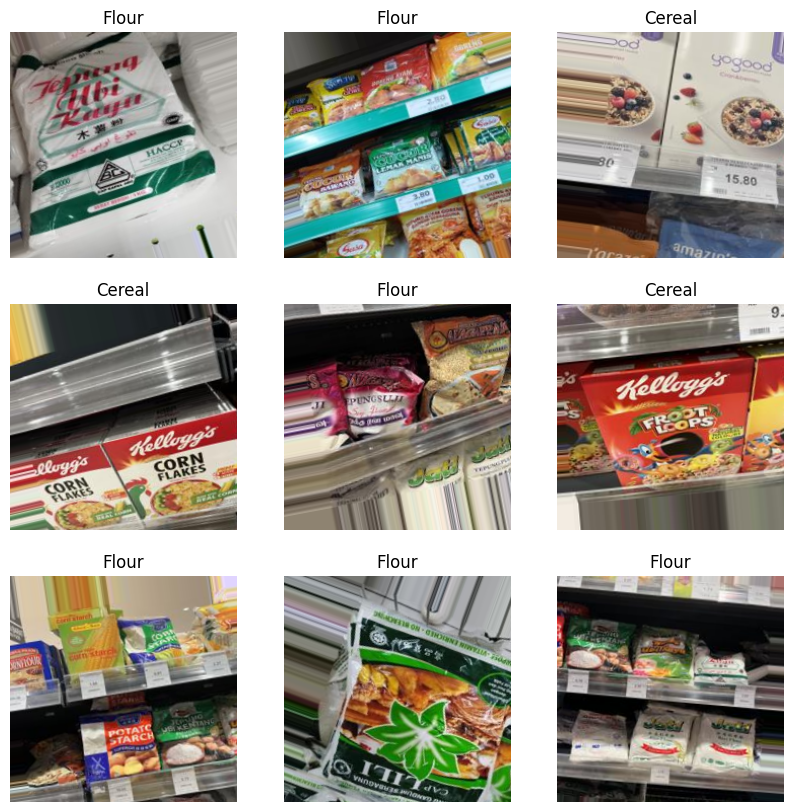

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                           

In [ ]:
#Freezing the existing weights
for layer in model.layers[-1:]:#unfreeze last layer only
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

# Compile the model

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

NameError: name 'model' is not defined

### Train the model

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
12/12 [==============================] - 1236s 102s/step - loss: 0.6932 - accuracy: 0.4821 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/3
 5/12 [===========>..................] - ETA: 11:52 - loss: 0.6931 - accuracy: 0.5120

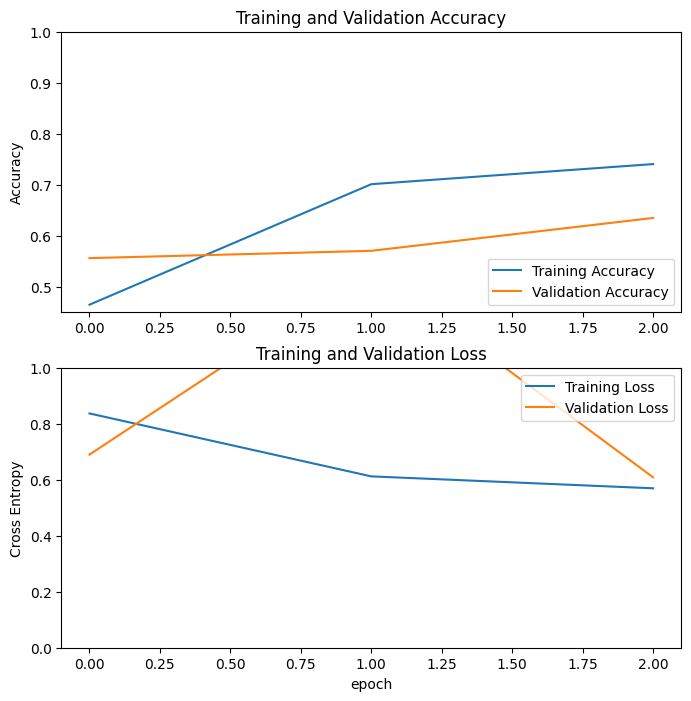

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()


In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

6/6 [==============================] - 168s 28s/step - loss: 0.6931 - accuracy: 0.5000


In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

**C) No image augmentation, Only unfreeze the last and 2nd last layer.**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil

import tensorflow as tf
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

!pip install zipfile36
from zipfile36 import ZipFile

In [ ]:
! gdown 1KKnQxPKhpps01K5KM9s1h2pJKmMYIL-S

Downloading...
From: https://drive.google.com/uc?id=1KKnQxPKhpps01K5KM9s1h2pJKmMYIL-S
To: /content/G3 Dataset.zip
100% 14.3M/14.3M [00:00<00:00, 153MB/s]


In [ ]:
with ZipFile('/content/G3 Dataset.zip','r') as zipObj:
  zipObj.extractall()

In [ ]:
batch_size = 50 # Of course here, we are using mini-batch gradient descent
img_height = 224
img_width = 224

In [ ]:
# Define the path to your dataset directory
dataset_dir = '/content/G3'

# Define the path to the directory where you want to create the train and test folders
output_dir = '/content/output'

# Define the percentage of data to be used for testing
test_split = 0.3

# Get the list of subfolders in the dataset directory
subfolders = [subfolder for subfolder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, subfolder))]

print(subfolders)

# Define the train and test folder paths
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')

# Delete train and test folders if they already exist
if os.path.exists(train_dir):
    shutil.rmtree(train_dir)
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)

# Create the train and test folders in the output directory
os.makedirs(train_dir)
os.makedirs(test_dir)

# Iterate over each subfolder and split the images into train and test sets
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_dir, subfolder)
    images = os.listdir(subfolder_path)
    train_images, test_images = train_test_split(images, test_size=test_split, random_state=42)

    # Create the subfolders inside train and test directories
    train_subfolder_dir = os.path.join(train_dir, subfolder)
    test_subfolder_dir = os.path.join(test_dir, subfolder)
    os.makedirs(train_subfolder_dir)
    os.makedirs(test_subfolder_dir)

    # Move the train images to the train folder
    for image in train_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(train_dir, subfolder, image)
        print(src)
        print(dst)
        shutil.copyfile(src, dst)

    # Move the test images to the test folder
    for image in test_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(test_dir, subfolder, image)
        shutil.copyfile(src, dst)

['Cereal', 'Flour']
/content/G3/Cereal/IMG_2956.jpg
/content/output/train/Cereal/IMG_2956.jpg
/content/G3/Cereal/1717913419186.jpg
/content/output/train/Cereal/1717913419186.jpg
/content/G3/Cereal/IMG_1730.jpg
/content/output/train/Cereal/IMG_1730.jpg
/content/G3/Cereal/IMG_1636.jpg
/content/output/train/Cereal/IMG_1636.jpg
/content/G3/Cereal/IMG_2994.jpg
/content/output/train/Cereal/IMG_2994.jpg
/content/G3/Cereal/1717838328775.jpg
/content/output/train/Cereal/1717838328775.jpg
/content/G3/Cereal/1717838328123.jpg
/content/output/train/Cereal/1717838328123.jpg
/content/G3/Cereal/Copy of Copy of IMG_20240527_104142.jpg
/content/output/train/Cereal/Copy of Copy of IMG_20240527_104142.jpg
/content/G3/Cereal/Copy of Copy of IMG_20240527_103858.jpg
/content/output/train/Cereal/Copy of Copy of IMG_20240527_103858.jpg
/content/G3/Cereal/Copy of Copy of IMG_20240527_103720.jpg
/content/output/train/Cereal/Copy of Copy of IMG_20240527_103720.jpg
/content/G3/Cereal/1717343588174.jpg
/content/ou

In [ ]:
# Define the path to the subfolder containing the images
test_Cereal_path = '/content/output/test/Cereal'
test_Flour_path = '/content/output/test/Flour'
train_Cereal_path = '/content/output/train/Cereal'
train_Flour_path = '/content/output/train/Flour'

# Count the number of images in the subfolder
num_images1 = len([name for name in os.listdir(test_Cereal_path) if os.path.isfile(os.path.join(test_Cereal_path, name))])
num_images2 = len([name for name in os.listdir(test_Flour_path) if os.path.isfile(os.path.join(test_Flour_path, name))])
num_images3 = len([name for name in os.listdir(train_Cereal_path) if os.path.isfile(os.path.join(train_Cereal_path, name))])
num_images4 = len([name for name in os.listdir(train_Flour_path) if os.path.isfile(os.path.join(train_Flour_path, name))])

# Print the number of images in the subfolder
print(f"Number of images in the test/Cereal: {num_images1}")
print(f"Number of images in the test/Flour: {num_images2}")
print(f"Number of images in the train/Cereal: {num_images3}")
print(f"Number of images in the train/Flour: {num_images4}")

Number of images in the test/Cereal: 150
Number of images in the test/Flour: 150
Number of images in the train/Cereal: 350
Number of images in the train/Flour: 350


In [ ]:
# data_dir = '/content/G3'
# train_dataset = tf.keras.utils.image_dataset_from_directory(
#   data_dir,
#   validation_split=0.2,
#   subset="training",
#   seed=123,
#   shuffle=True,
#   image_size=(img_height, img_width),
#   batch_size=batch_size)


# validation_dataset = tf.keras.utils.image_dataset_from_directory(
#   data_dir,
#   validation_split=0.2,
#   subset="validation",
#   seed=123,
#   shuffle=True,
#   image_size=(img_height, img_width),
#   batch_size=batch_size)


# Create an instance of the ImageDataGenerator with for training and testing
train_data_generator = ImageDataGenerator( validation_split=0.2) # 20% from training will be leaved out for validation
test_data_generator = ImageDataGenerator()

names = ["Cereal" , "Flour"] #make sure the spelling is similar to the folder name

# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = 50,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

# Create the validation batch generator
validation_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (224, 224),
    class_mode = 'sparse', #make label as integer value
    subset='validation',
    batch_size = 50,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)


# Create the test generator
test_batches = test_data_generator.flow_from_directory(
    '/content/output/test',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    batch_size = 50,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 560 images belonging to 2 classes.
Found 140 images belonging to 2 classes.
Found 300 images belonging to 2 classes.


(50, 224, 224, 3)
(50,)


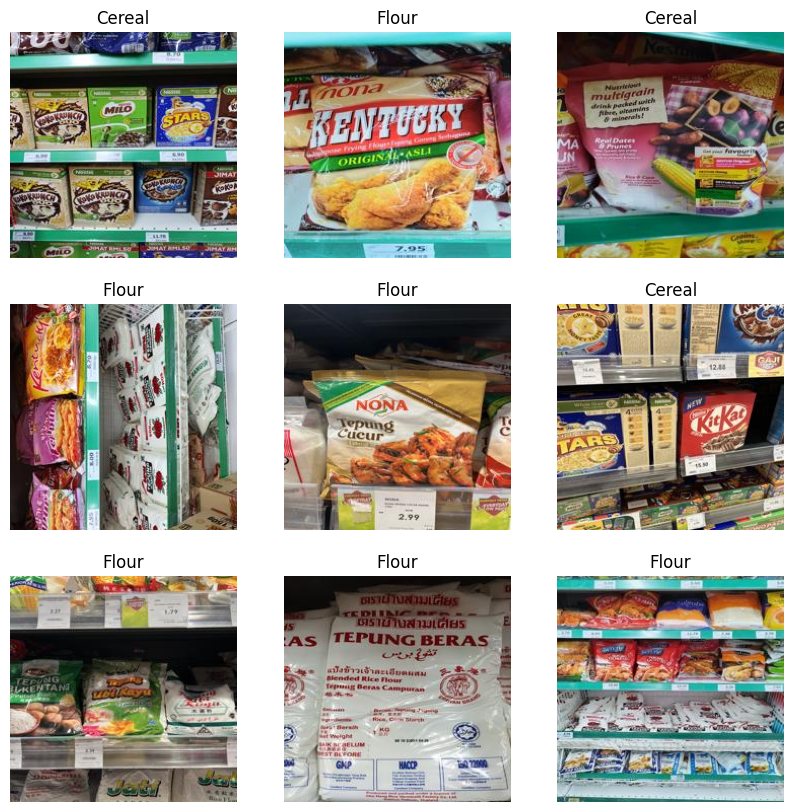

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

In [ ]:
# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

# print(type(base_model))
print("****VGG16 original network arhitecture****")
base_model.summary()

****VGG16 original network arhitecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxP

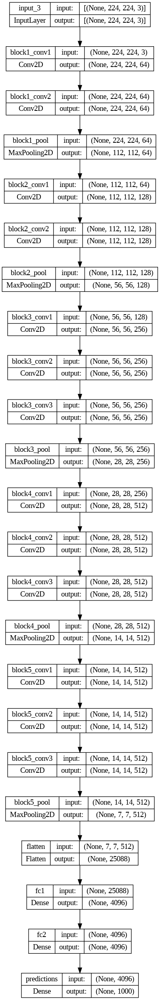

In [ ]:
tf.keras.utils.plot_model(base_model, to_file = 'VGG16_basemodel.png', show_shapes = True)

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                           

In [ ]:
#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

#example if your want to unfreeze 2 last layers
for layer in model.layers[-2:]:
    layer.trainable = True

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

****model after add new dense layer replacing the previous VGG16 last layer****
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                        

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
12/12 [==============================] - 1190s 99s/step - loss: 35983.6289 - accuracy: 0.5393 - val_loss: 36.3492 - val_accuracy: 0.5000
Epoch 2/3
12/12 [==============================] - 1168s 97s/step - loss: 15.9164 - accuracy: 0.4786 - val_loss: 2.1590 - val_accuracy: 0.5000
Epoch 3/3
12/12 [==============================] - 1216s 102s/step - loss: 8.4373 - accuracy: 0.4857 - val_loss: 1.2592 - val_accuracy: 0.5000


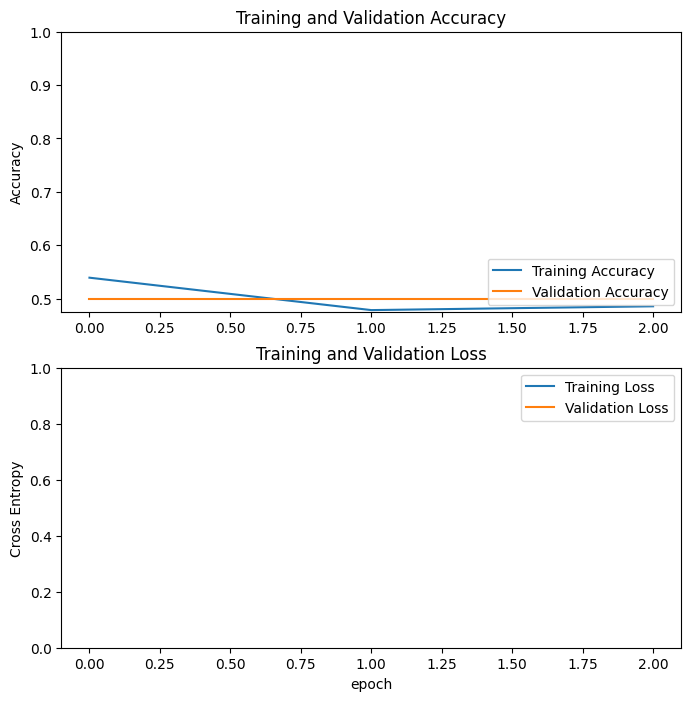

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()


In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

6/6 [==============================] - 166s 28s/step - loss: 1.4666 - accuracy: 0.5000
Test accuracy: 0.5


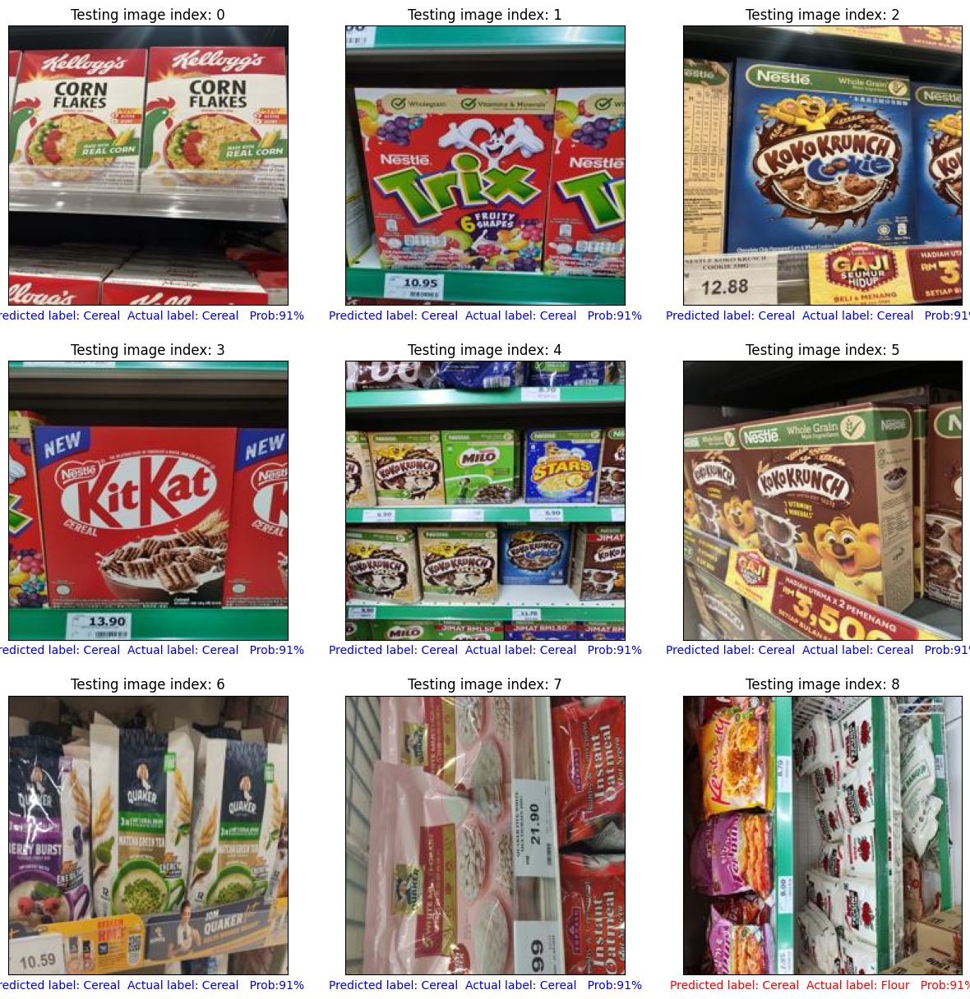

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

## Chapter 3: Discussion

In this section, we will discuss the performance of the VGG16 model under different settings. With no augmentation and only the last layer unfrozen, the model correctly predicted 6 out of 9 images, but misclassified images of flour as cereal, achieving an accuracy of 50%. In contrast, the model trained with image augmentation and only the last layer unfrozen showed a significant improvement, achieving an accuracy of 81%. This demonstrates that image augmentation helps the model generalize better and reduces overfitting by exposing it to a more diverse dataset. Conversely, the model trained without image augmentation but with the last and second last layers unfrozen showed an accuracy of 62% with a probability of 80%. However, it misclassified 4 out of 5 images of flour as cereal. These results highlight the importance of image augmentation in improving the performance and generalization of the VGG16 model by enhancing the diversity and variability of the training data, thereby preventing the model from memorizing the training data and helping it learn more comprehensive and invariant features. Unfreezing the last layer also contributes to task-specific fine-tuning, allowing the model to adjust its final classification parameters based on the new dataset, which enhances its ability to distinguish between classes and increases accuracy.

Image augmentation improves the performance of the VGG16 model by enhancing the diversity and variability of the training data, leading to better generalization to new, unseen data (Shorten & Khoshgoftaar, 2019). By applying random transformations such as rotations, translations, flips, and color adjustments, augmentation creates a more varied dataset, helping the VGG16 model recognize objects in different orientations and lighting conditions. This increased data variability acts as a form of regularization, reducing overfitting by preventing the model from memorizing the training data and forcing it to focus on essential features (Santos & Papa, 2022). As a result, the VGG16 model learns more comprehensive and invariant features, better capturing the essence of the objects it needs to classify. Additionally, by simulating real-world variations, image augmentation prepares the VGG16 model to handle distortions, occlusions, and varied backgrounds, ultimately leading to improved accuracy and robustness.

Unfreezing the last layer of a VGG16 model improves performance by allowing task-specific fine-tuning (Davila et al., 2024), where the model adjusts its final classification parameters based on the new dataset. This adaptation enhances the model's ability to distinguish between classes by tailoring the high-level features to the unique patterns of the new data. As a result, the model achieves better generalization and increased accuracy, benefiting from the pre-trained weights while making necessary adjustments for the specific task. Additionally, unfreezing only the last layer maintains training efficiency and mitigates the risk of overfitting compared to retraining the entire network, providing a balanced approach to improving model performance (Learning Without Forgetting, 2018).

## Chapter 4: Conclusion

The accuracy and generalisation capacity of the VGG16 model are clearly improved by picture augmentation, as demonstrated by the model's performance evaluation in various scenarios. The model accurately predicted 6 out of 9 photos with a modest accuracy of 0.5 when no augmentation was applied and only the final layer was unfrozen. However, it had trouble differentiating between cereal and flour. Accuracy was raised to 0.81 by adding picture augmentation while just unfreezing the final layer, which was an important improvement. This demonstrates how augmentation lessens overfitting and improves model generalisation. In contrast, the model misclassified four out of five flour images as cereal when the last two layers were unfrozen without augmentation, resulting in an accuracy of 0.62. This suggests that the model was less successful in the absence of the diversity that augmentation supplied.

In summary, convolutional neural networks' (CNNs') performance can be greatly enhanced by using image augmentation. Augmentation improves the model's ability to generalise to new, unknown data by adding diversity and variability to the training set through transformations like rotations, translations, and colour modifications. Regularisation is achieved by this procedure, which also helps the model concentrate on important features instead of learning the entire set of training data. As a result, image augmentation-trained models are more resilient to fluctuations in the actual world, which improves their accuracy and resilience in image classification tasks.

## References

1.  Siddiqui, S. A., Salman, A., Malik, M. I., Shafait, F., Mian, A., Shortis, M. R., & Harvey, E. S. (2017). Automatic fish species classification in underwater videos: exploiting pre-trained deep neural network models to compensate for limited labelled data. ICES Journal of Marine Science, 75(1), 374–389. https://doi.org/10.1093/icesjms/fsx109

2.   Khanam, R. (2023, June 27). Transfer Learning in Deep Learning: Leveraging Pretrained Models for Improved performance | By Rahima Khanam | Artificial Intelligence in Plain English. Medium. https://ai.plainenglish.io/transfer-learning-in-deep-learning-leveraging-pretrained-models-for-improved-performance-b4c49f2cd644

3. Yosinski, J., Clune, J., Nguyen, A., Fuchs, T., and Lipson, H. 2015.Understanding neural networks through deep visualization.Proceedings in the International Conference on MachineLearning Workshop on Deep Learning.

4. Shorten, C., & Khoshgoftaar, T. M. (2019). A survey on Image Data Augmentation for Deep Learning. Journal of Big Data, 6(1). https://doi.org/10.1186/s40537-019-0197-0

5. Santos, C. F. G. D., & Papa, J. P. (2022). Avoiding Overfitting: A survey on regularization methods for convolutional neural networks. ACM Computing Surveys, 54(10s), 1–25. https://doi.org/10.1145/3510413

6. Davila, A., Colan, J., & Hasegawa, Y. (2024). Comparison of fine-tuning strategies for transfer learning in medical image classification. Image and Vision Computing, 146, 105012. https://doi.org/10.1016/j.imavis.2024.105012

7. Learning without Forgetting. (2018, December 1). IEEE Journals & Magazine | IEEE Xplore. https://ieeexplore.ieee.org/abstract/document/8107520


